# Without specific word filtering

C:\Users\chari\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\chari\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


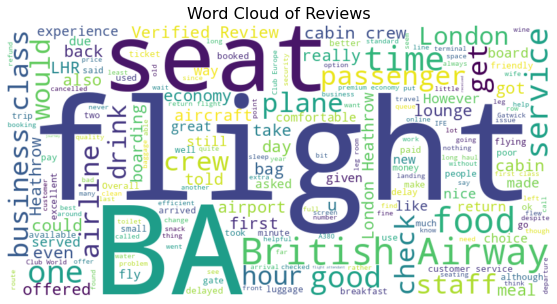

In [1]:
# Import necessary libraries
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import string

# Load the dataset
# Replace 'reviews.csv' with your dataset file name
data = pd.read_csv('./data_SA.csv')

# Ensure there's a 'review' column
if 'Review' not in data.columns:
    raise ValueError("The dataset must contain a 'review' column.")

# Combine all reviews into a single text
text = " ".join(review for review in data['Review'])

# Optional: Customize the list of stopwords
import nltk
nltk.download('stopwords')
stop_words = set(stopwords.words('english')) | set(string.punctuation)

# Generate the word cloud
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color="white",
    stopwords=stop_words,
    colormap="viridis",
    max_words=200
).generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Turn off the axis
plt.title("Word Cloud of Reviews", fontsize=16)
plt.show()


# Positive and Negative Reviews

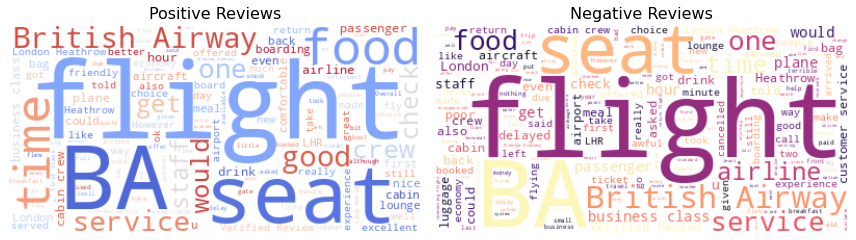

In [2]:
positive_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Positive']['Review'])
negative_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Negative']['Review'])

# Generate word clouds for positive and negative reviews
positive_wordcloud = WordCloud(stopwords=stop_words, background_color="white", colormap="coolwarm").generate(positive_text)
negative_wordcloud = WordCloud(stopwords=stop_words, background_color="white", colormap="magma").generate(negative_text)

# Plot the word clouds side by side
plt.figure(figsize=(12, 6))

# Positive Word Cloud
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Positive Reviews", fontsize=16)

# Negative Word Cloud
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Negative Reviews", fontsize=16)

# Display the plot
plt.tight_layout()
plt.show()

# Comparing common words in positive and negative reviews

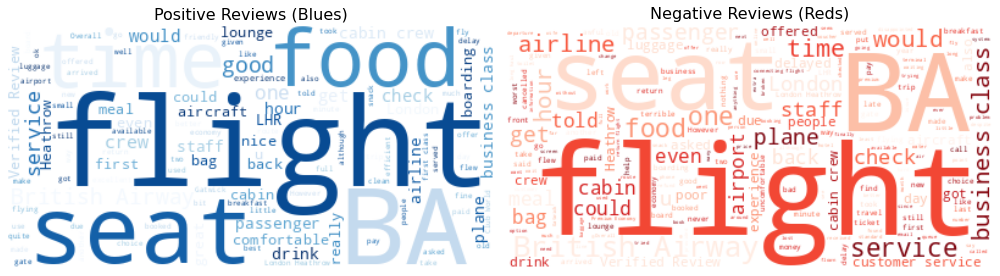

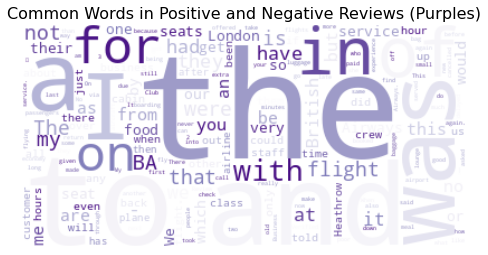

In [3]:
# Filter reviews by sentiment (Positive and Negative)
positive_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Positive']['Review'])
negative_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Negative']['Review'])

# Generate word clouds for positive and negative reviews
positive_wordcloud = WordCloud(stopwords=stop_words, background_color="white", colormap="Blues").generate(positive_text)
negative_wordcloud = WordCloud(stopwords=stop_words, background_color="white", colormap="Reds").generate(negative_text)

# Plot the word clouds side by side
plt.figure(figsize=(14, 7))

# Positive Word Cloud
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Positive Reviews (Blues)", fontsize=16)

# Negative Word Cloud
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Negative Reviews (Reds)", fontsize=16)

# Display the plot
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# To highlight common words in both Positive and Negative reviews:
# Find common words
from collections import Counter

# Tokenize the words in both positive and negative reviews
positive_words = positive_text.split()
negative_words = negative_text.split()

# Get common words (intersection)
common_words = set(positive_words) & set(negative_words)

# Count the frequency of common words
common_word_count = {word: min(positive_words.count(word), negative_words.count(word)) for word in common_words}

# Now create a word cloud for common words
common_wordcloud = WordCloud(stopwords=stop_words, background_color="white", colormap="Purples").generate_from_frequencies(common_word_count)

# Plot the common words word cloud
plt.figure(figsize=(8, 8))
plt.imshow(common_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Common Words in Positive and Negative Reviews (Purples)", fontsize=16)
plt.show()


# Removing Domain-specific stopwords : Flight Industry

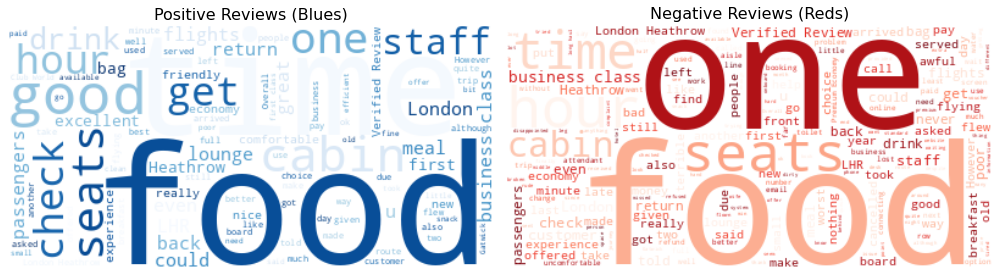

          Word  Count
132       food   1805
217       good   1704
5        cabin   1549
48       seats   1411
527     london   1370
125       time   1334
207        one   1226
347      class   1167
1032  business   1129
124      first   1127
Top 10 Words in Positive Reviews:
          Word  Count
132       food   1805
217       good   1704
5        cabin   1549
48       seats   1411
527     london   1370
125       time   1334
207        one   1226
347      class   1167
1032  business   1129
124      first   1127

Top 10 Words in Negative Reviews:
          Word  Count
55      london    613
674   business    613
248       food    593
426        one    565
272      seats    545
697      class    538
479      staff    505
1167     cabin    483
93         get    476
33          us    423


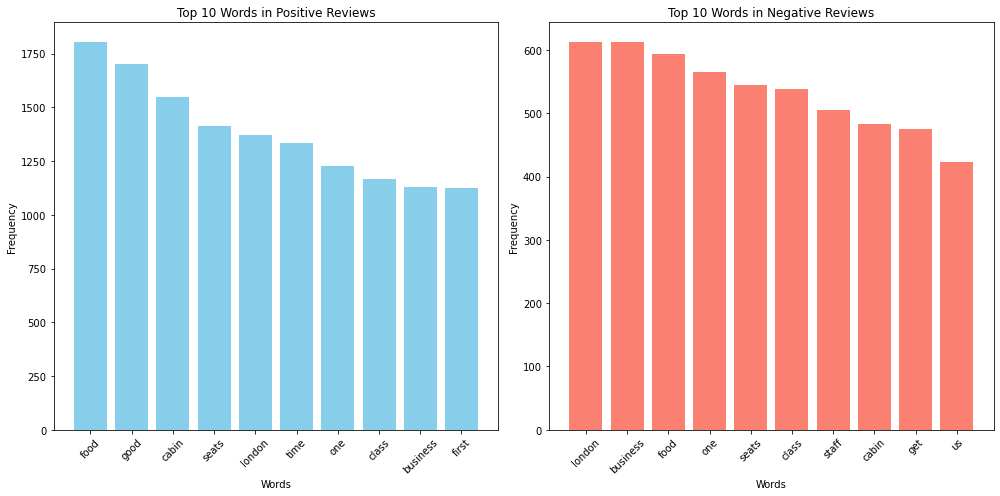

In [4]:
# Domain-specific stopwords related to flight reviews
flight_stopwords = set([
    "british", "airways", "flight", "airline", "plane", "seat", "boarding", "crew", "ticket", "service",
    "ba","-", "delayed", "airport", "luggage", "baggage", "check-in", "boarding", "travel", "class"
    "arrival", "departure", "gate", "delay", "pilot", "flight attendants", "aircraft", "would", "one"
    "journey", "schedule", "terminal", "passenger", "air", "booked", "connection", "boarding pass",
    "plane", "plane's", "flight's", "airlines", "baggage claim", "check in", "traveling", "fly"
])

# Combine NLTK stopwords with the custom flight stopwords
combined_stopwords = stop_words.union(flight_stopwords)

# Filter reviews by sentiment (Positive and Negative)
positive_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Positive']['Review'])
negative_text = " ".join(review for review in data[data['Sentiment_TextBlob'] == 'Negative']['Review'])

# Generate word clouds for positive and negative reviews, using the combined stopwords
positive_wordcloud = WordCloud(stopwords=combined_stopwords, background_color="white", colormap="Blues").generate(positive_text)
negative_wordcloud = WordCloud(stopwords=combined_stopwords, background_color="white", colormap="Reds").generate(negative_text)

# Plot the word clouds side by side
plt.figure(figsize=(14, 7))

# Positive Word Cloud
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Positive Reviews (Blues)", fontsize=16)

# Negative Word Cloud
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Negative Reviews (Reds)", fontsize=16)

# Display the plot
plt.tight_layout()
plt.show()

# ---------------------------------------
# To get word counts and display them as a table

# Get word frequency counts for the positive reviews text
word_frequencies = Counter([word.lower() for word in positive_text.split() if word.lower() not in combined_stopwords])

# Create a DataFrame from the word frequencies
word_counts_df = pd.DataFrame(word_frequencies.items(), columns=["Word", "Count"])

# Sort the word counts by frequency
word_counts_df = word_counts_df.sort_values(by="Count", ascending=False)

# Display the word counts as a table
print(word_counts_df.head(10))  # Show top 10 words

# -----------------------------------------------------
# To get word frequency counts for positive and negative reviews

# Get word frequency counts for positive reviews text
positive_word_frequencies = Counter([word.lower() for word in positive_text.split() if word.lower() not in combined_stopwords])

# Get word frequency counts for negative reviews text
negative_word_frequencies = Counter([word.lower() for word in negative_text.split() if word.lower() not in combined_stopwords])

# Create DataFrames for word counts
positive_word_counts_df = pd.DataFrame(positive_word_frequencies.items(), columns=["Word", "Count"])
negative_word_counts_df = pd.DataFrame(negative_word_frequencies.items(), columns=["Word", "Count"])

# Sort the DataFrames by frequency
positive_word_counts_df = positive_word_counts_df.sort_values(by="Count", ascending=False)
negative_word_counts_df = negative_word_counts_df.sort_values(by="Count", ascending=False)

# Display the top 10 words for positive and negative reviews
print("Top 10 Words in Positive Reviews:")
print(positive_word_counts_df.head(10))

print("\nTop 10 Words in Negative Reviews:")
print(negative_word_counts_df.head(10))

# -----------------------------------------------------
# To display the word counts as bar charts

# Get the top 10 most frequent words for positive reviews
positive_top_words = positive_word_frequencies.most_common(10)

# Get the top 10 most frequent words for negative reviews
negative_top_words = negative_word_frequencies.most_common(10)

# Extract words and counts for positive reviews
positive_words, positive_counts = zip(*positive_top_words)

# Extract words and counts for negative reviews
negative_words, negative_counts = zip(*negative_top_words)

# Plotting the bar charts for positive and negative word frequencies
plt.figure(figsize=(14, 7))

# Positive Word Frequency Bar Chart
plt.subplot(1, 2, 1)
plt.bar(positive_words, positive_counts, color='skyblue')
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 10 Words in Positive Reviews")
plt.xticks(rotation=45)

# Negative Word Frequency Bar Chart
plt.subplot(1, 2, 2)
plt.bar(negative_words, negative_counts, color='salmon')
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 10 Words in Negative Reviews")
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

# Analyzing by countries

Analyzing Reviews for United Kingdom


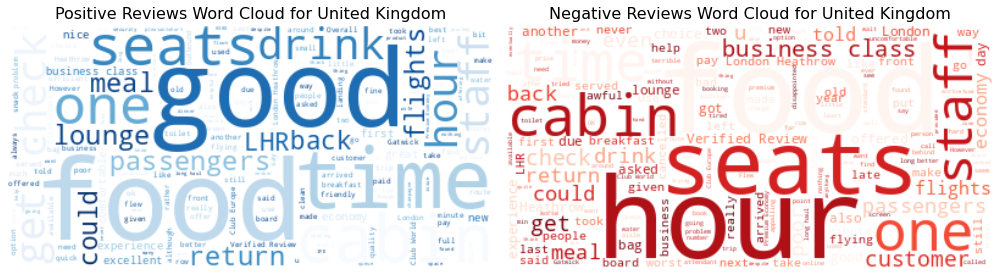

Analyzing Reviews for Australia


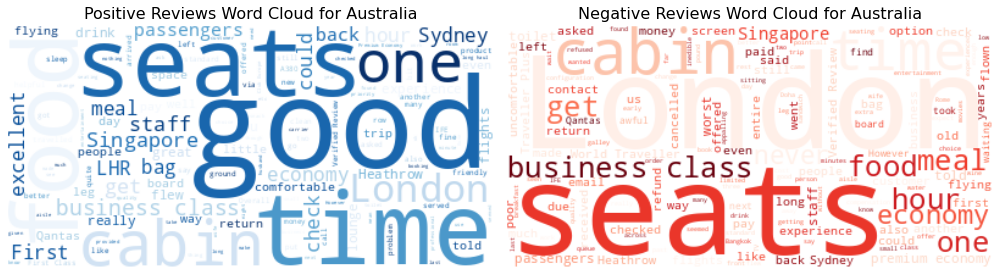

Analyzing Reviews for United States


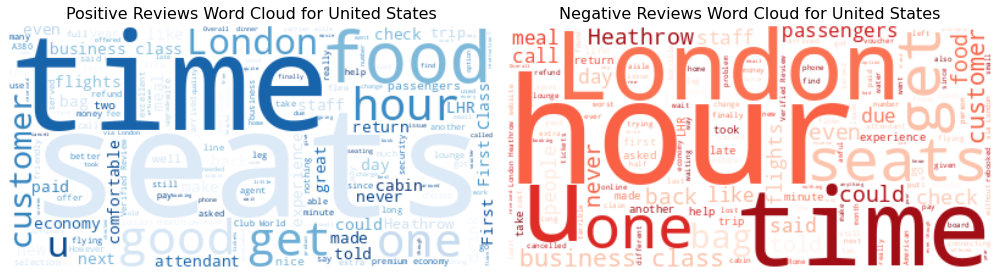

Analyzing Reviews for Iceland


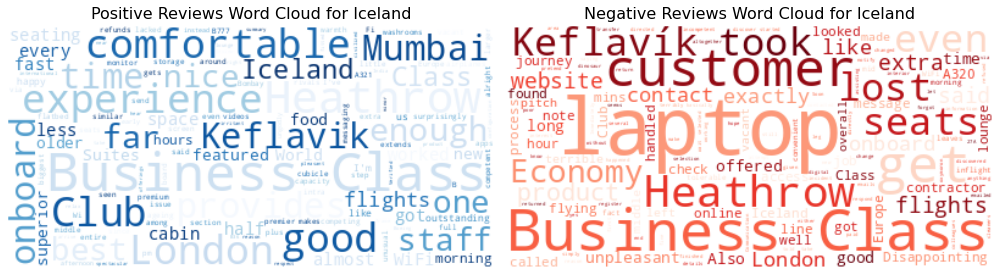

Analyzing Reviews for Singapore


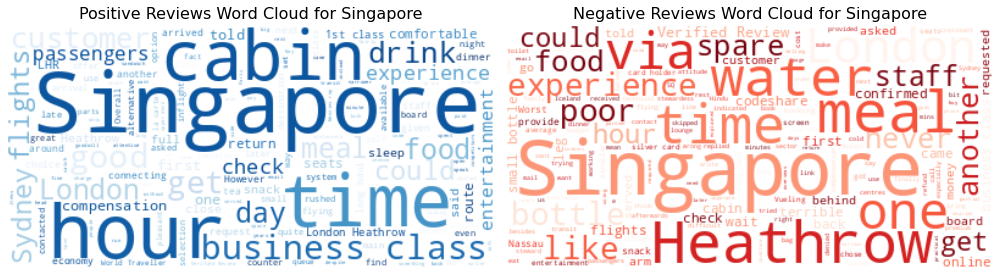

Analyzing Reviews for Turkey


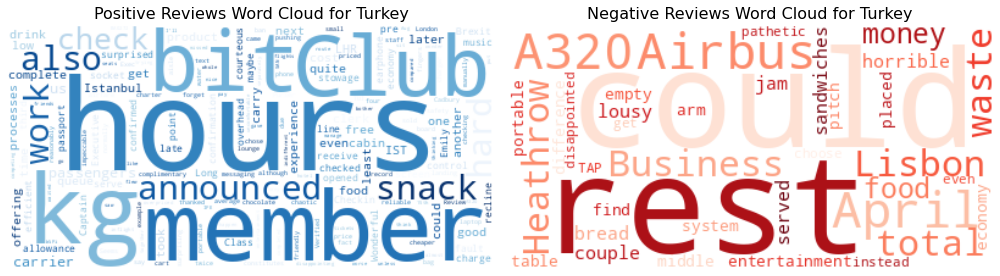

Analyzing Reviews for Canada


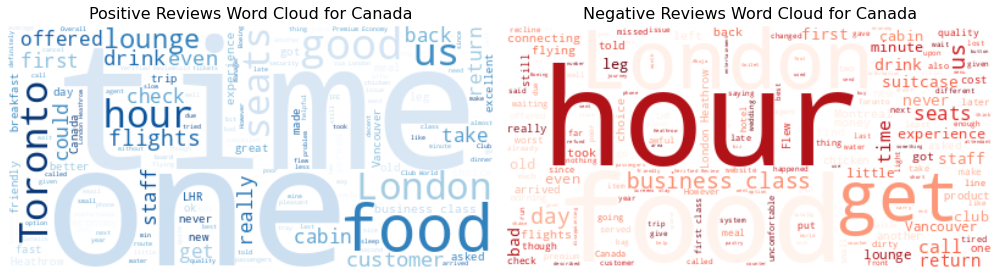

Analyzing Reviews for India


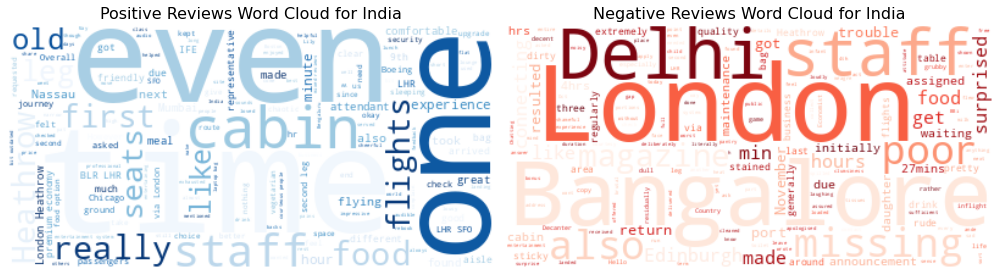

Analyzing Reviews for Switzerland


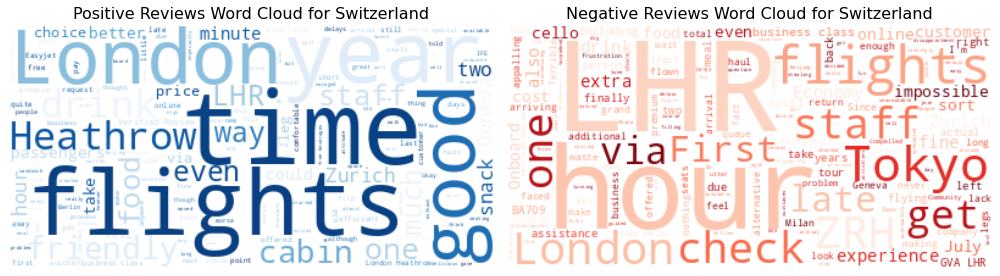

Analyzing Reviews for South Africa


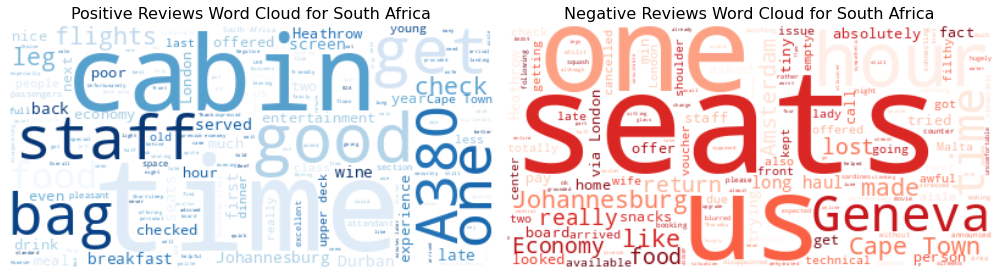

Analyzing Reviews for Germany


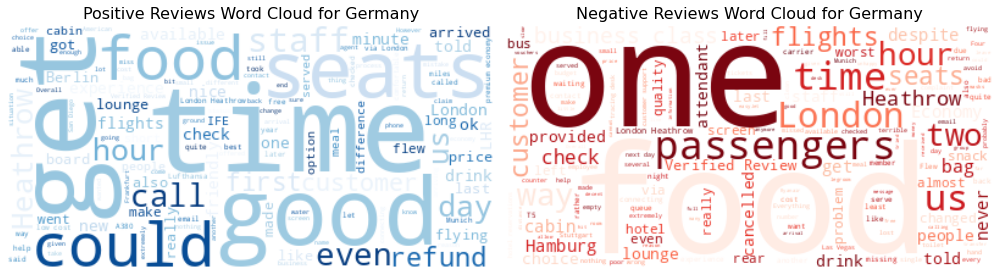

Analyzing Reviews for Morocco


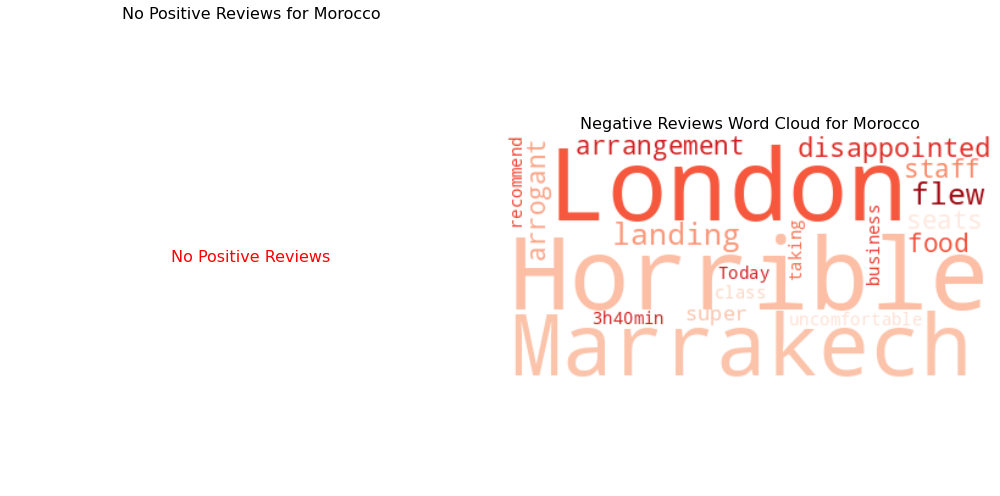

Analyzing Reviews for Hong Kong


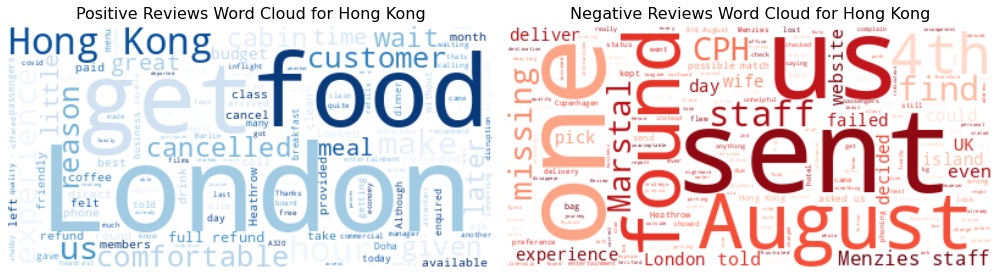

Analyzing Reviews for Lebanon


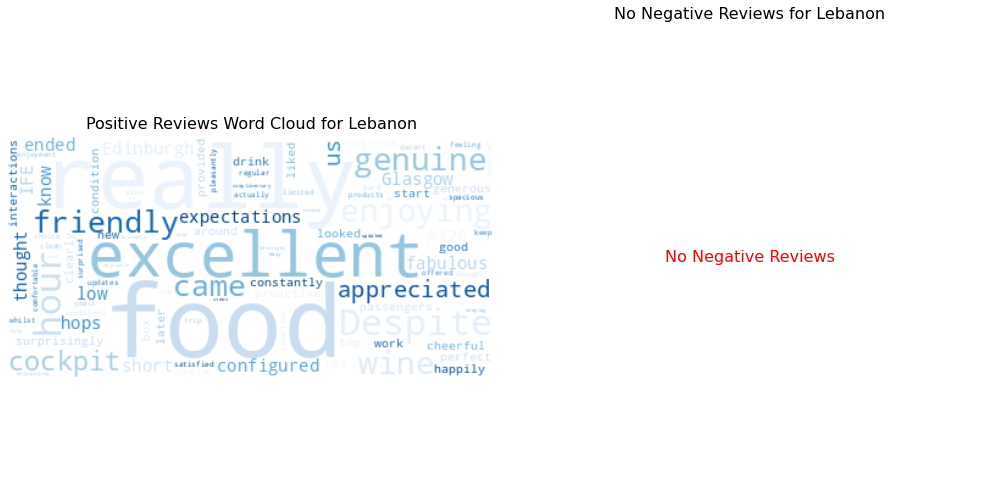

Analyzing Reviews for Italy


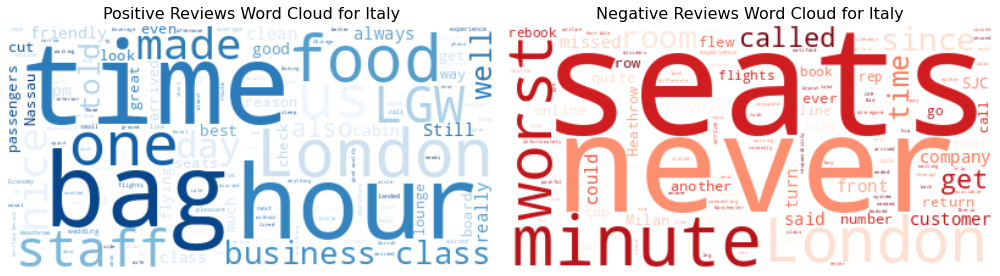

Analyzing Reviews for New Zealand


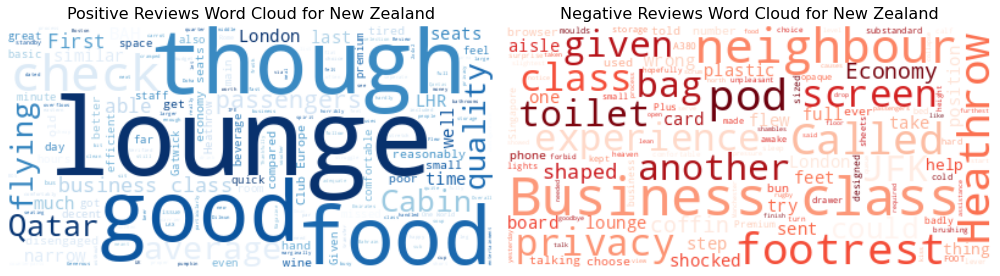

Analyzing Reviews for Austria


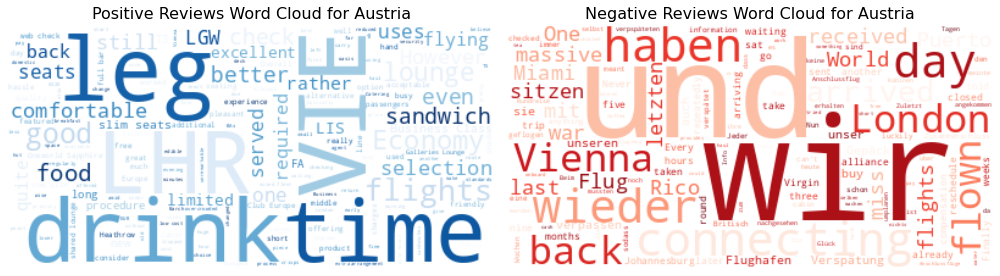

Analyzing Reviews for Denmark


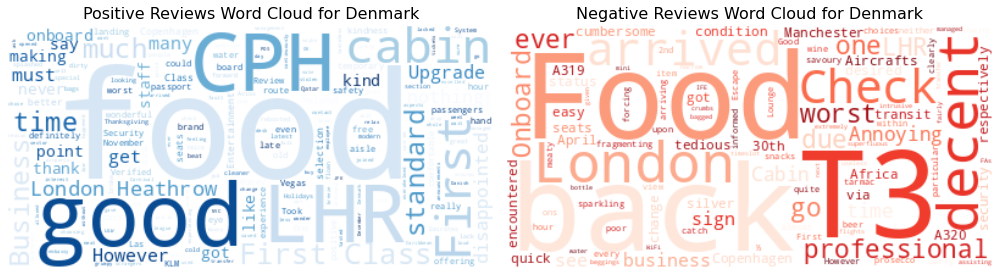

Analyzing Reviews for Netherlands


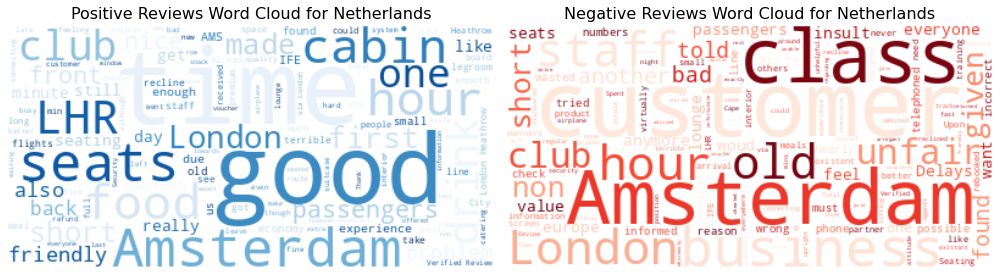

Analyzing Reviews for Belgium


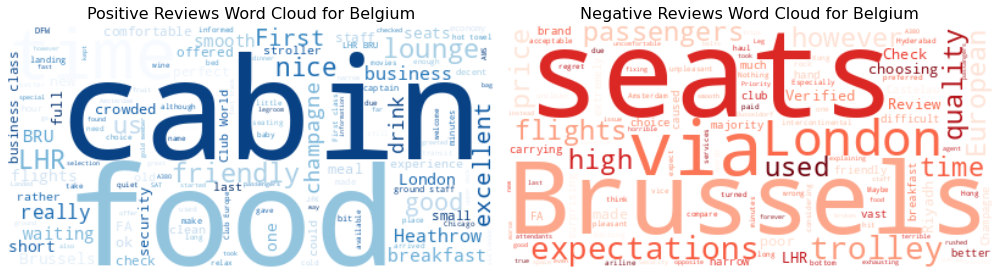

Analyzing Reviews for Nigeria


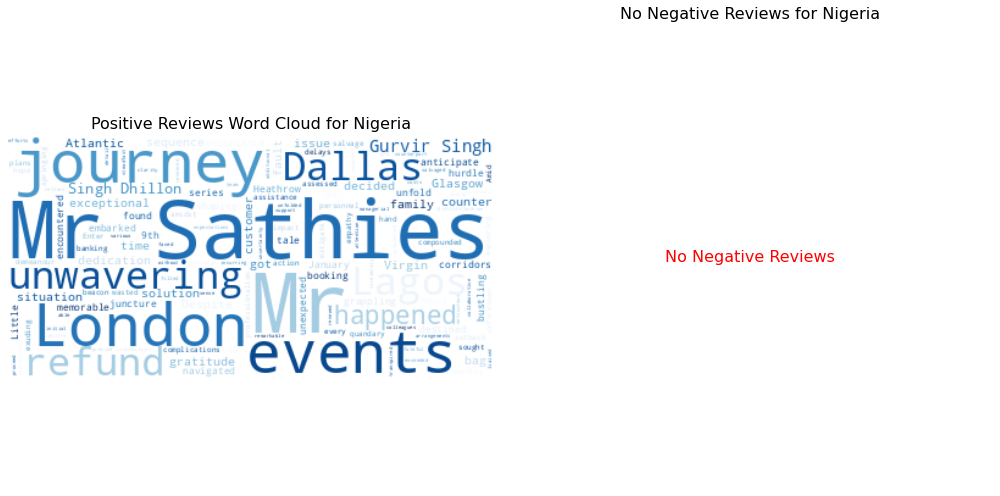

Analyzing Reviews for Japan


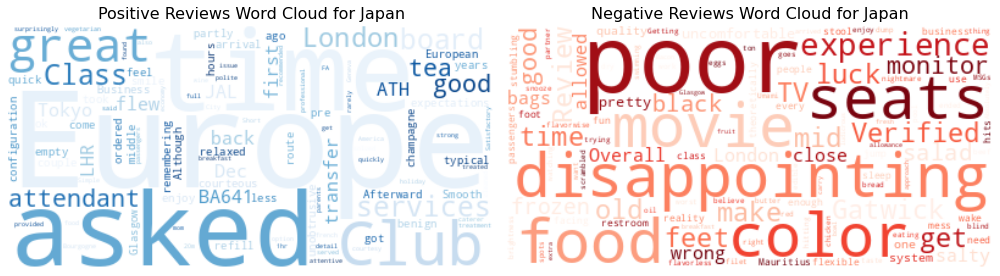

Analyzing Reviews for Ukraine


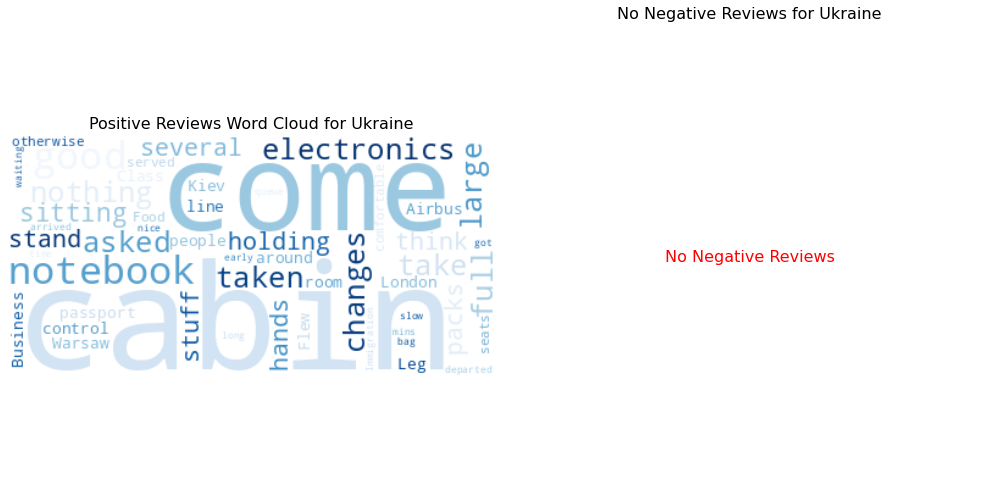

Analyzing Reviews for Ireland


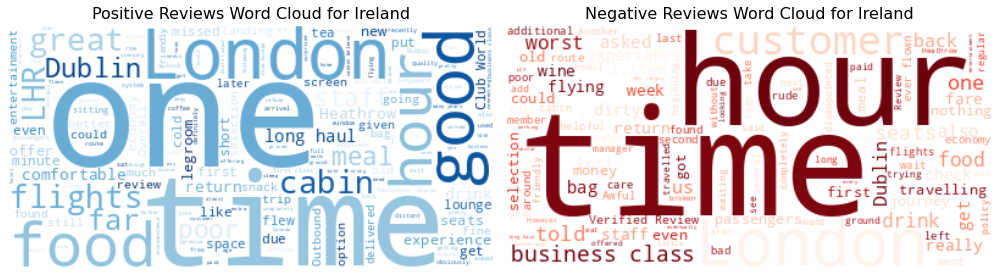

Analyzing Reviews for Spain


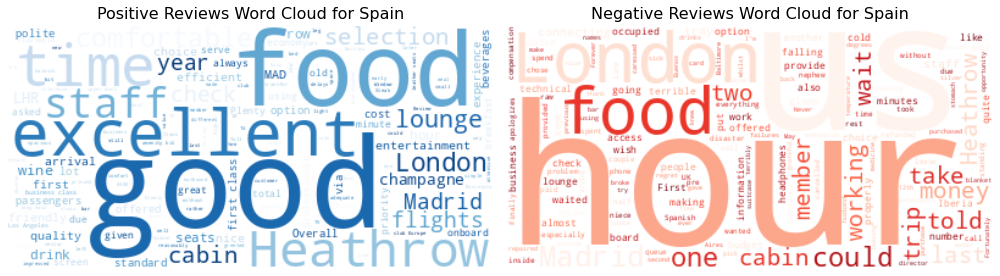

Analyzing Reviews for China


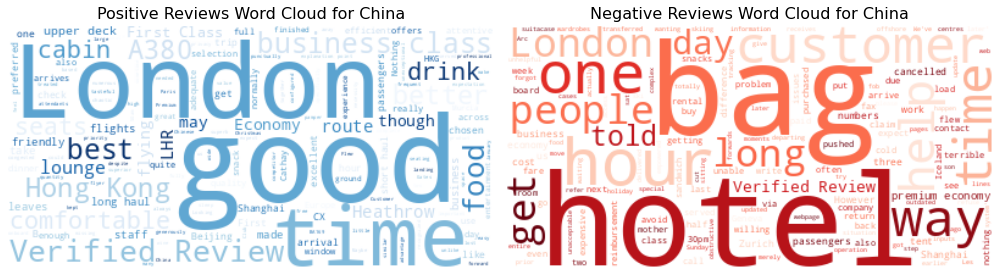

Analyzing Reviews for Ecuador


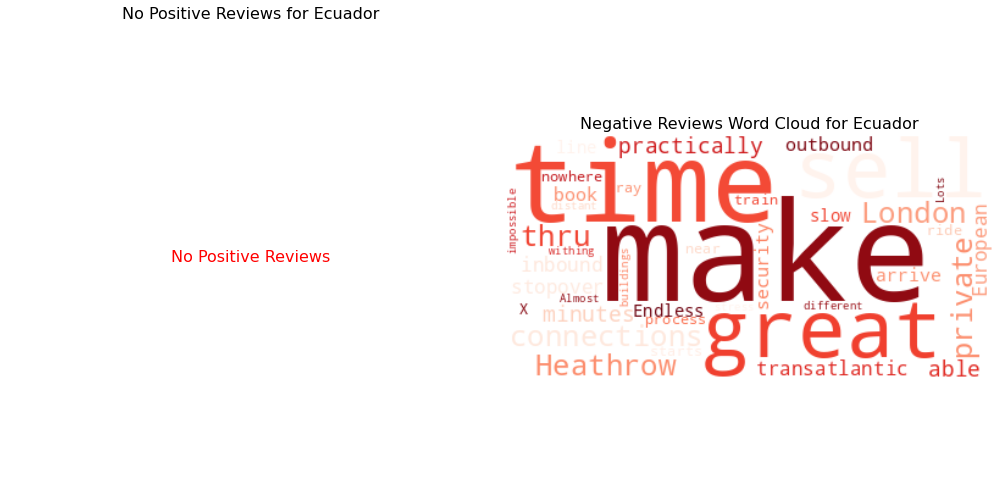

Analyzing Reviews for Romania


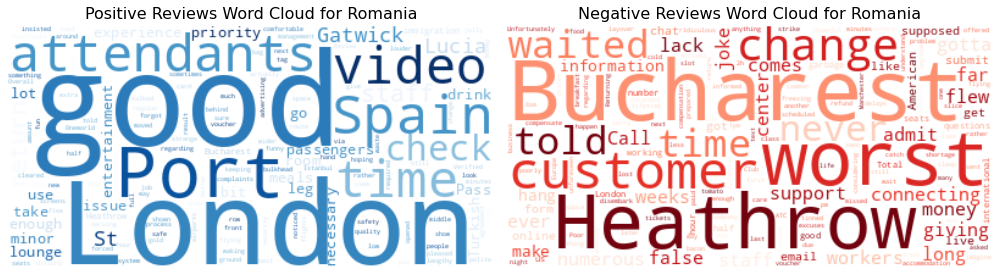

Analyzing Reviews for France


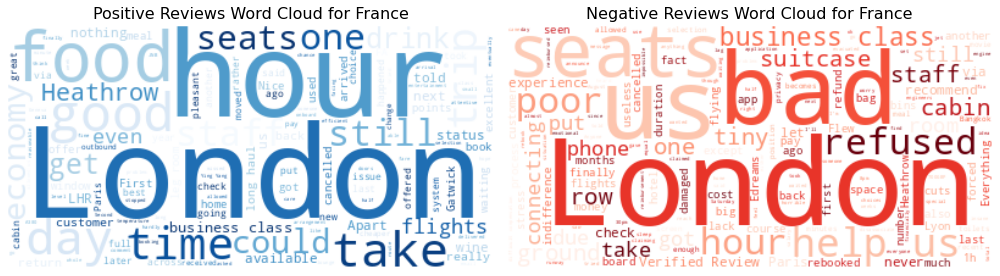

Analyzing Reviews for Kuwait


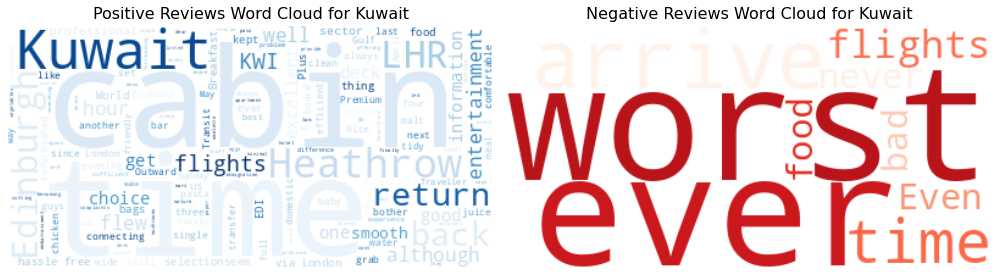

Analyzing Reviews for Poland


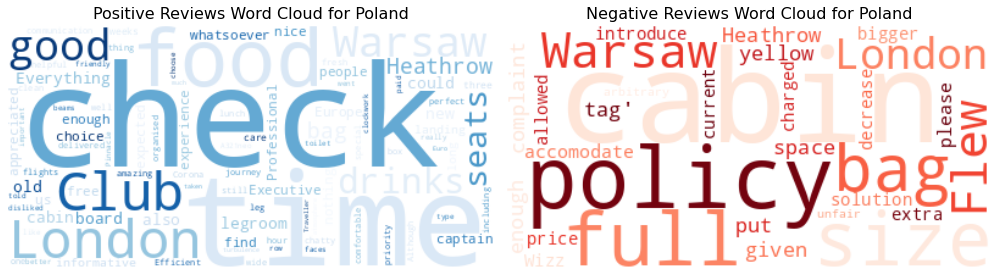

Analyzing Reviews for Qatar


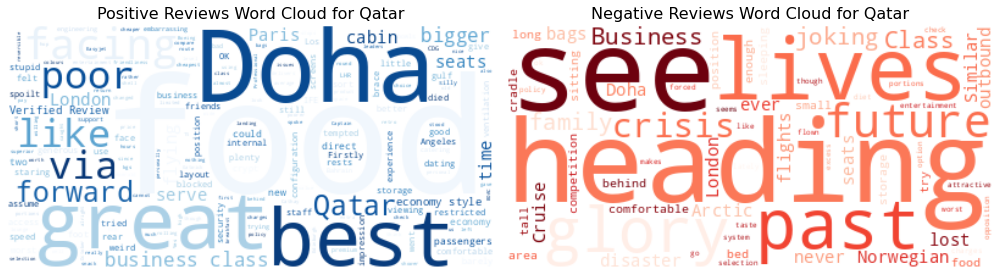

Analyzing Reviews for Greece


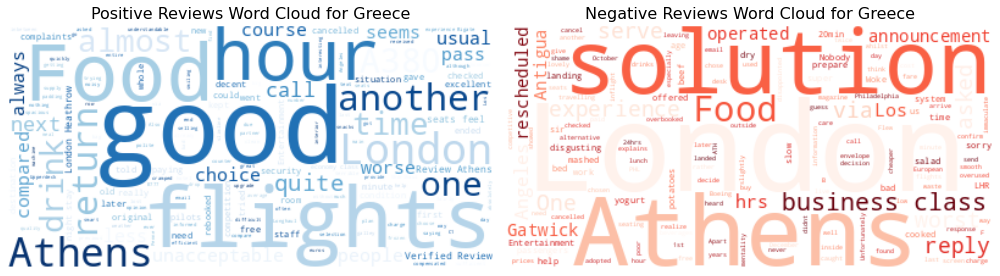

Analyzing Reviews for Senegal


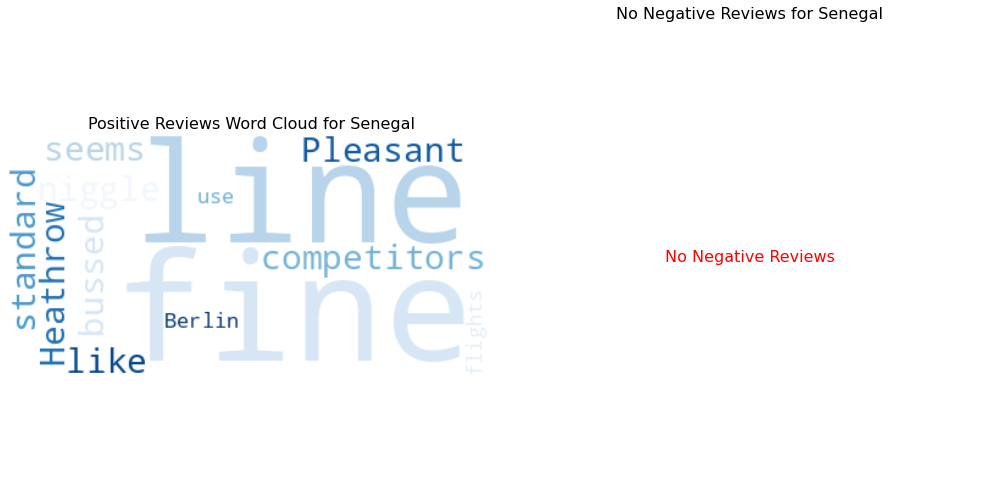

Analyzing Reviews for United Arab Emirates


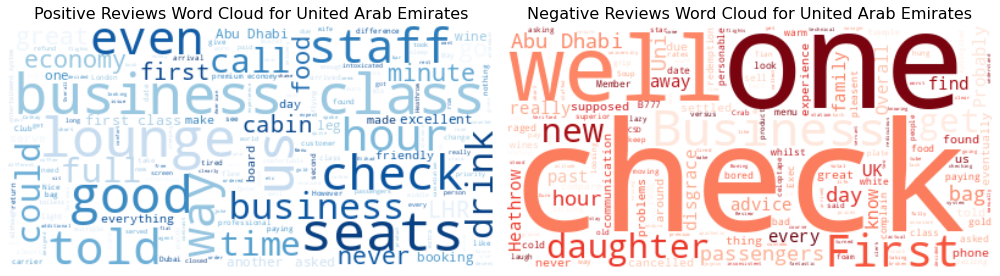

Analyzing Reviews for Cyprus


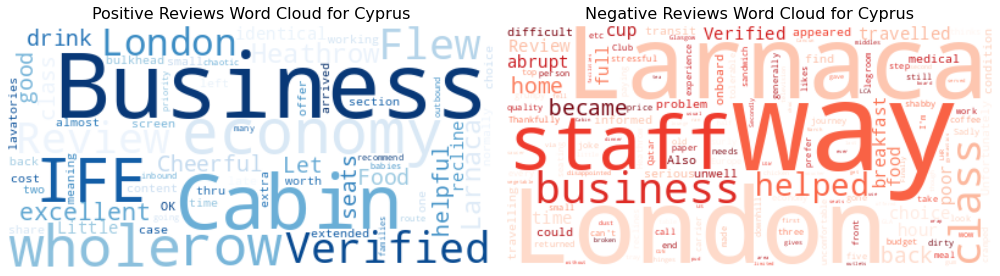

Analyzing Reviews for Chile


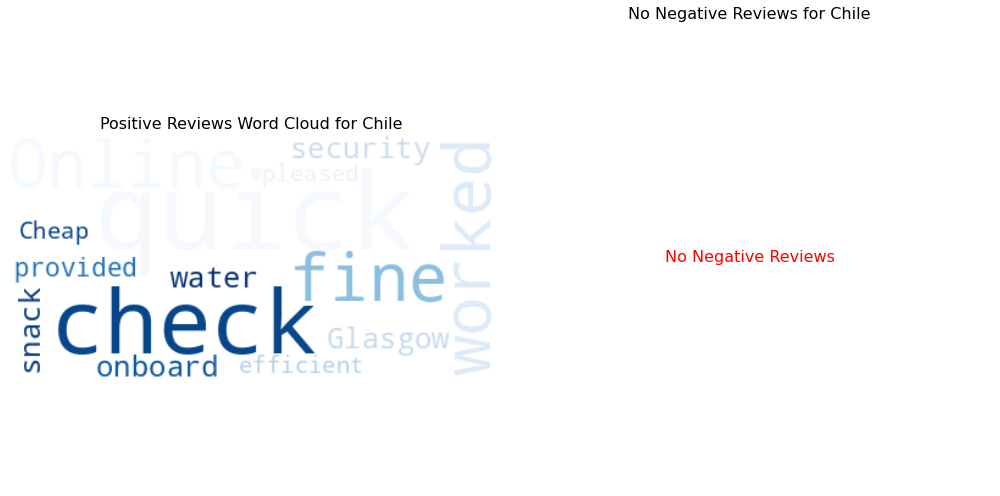

Analyzing Reviews for Sweden


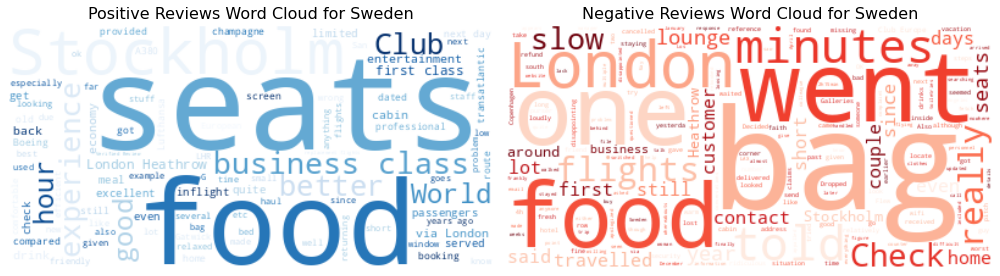

Analyzing Reviews for Czech Republic


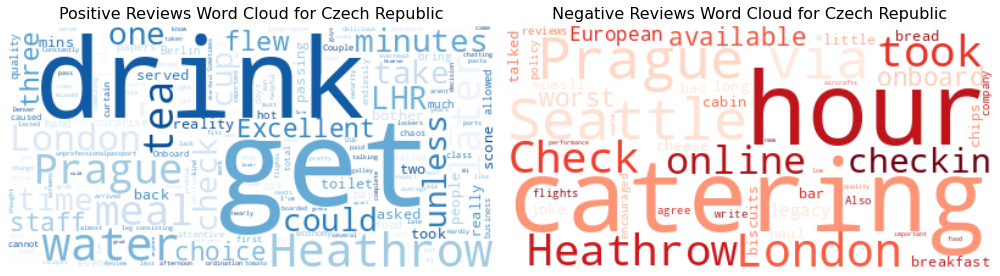

Analyzing Reviews for Malaysia


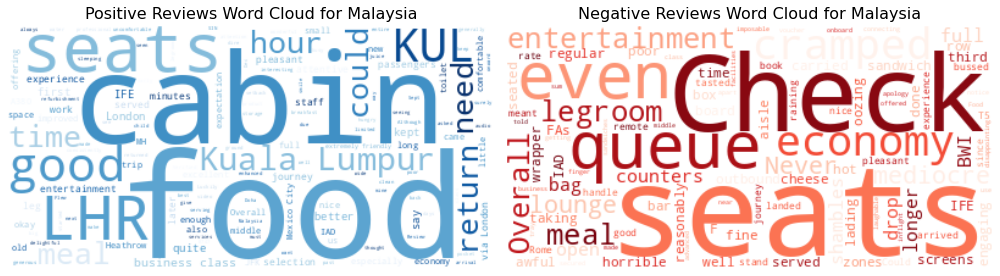

Analyzing Reviews for Ghana


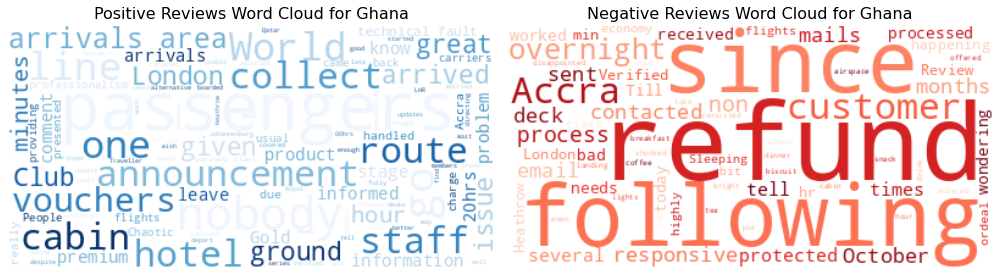

Analyzing Reviews for Bermuda


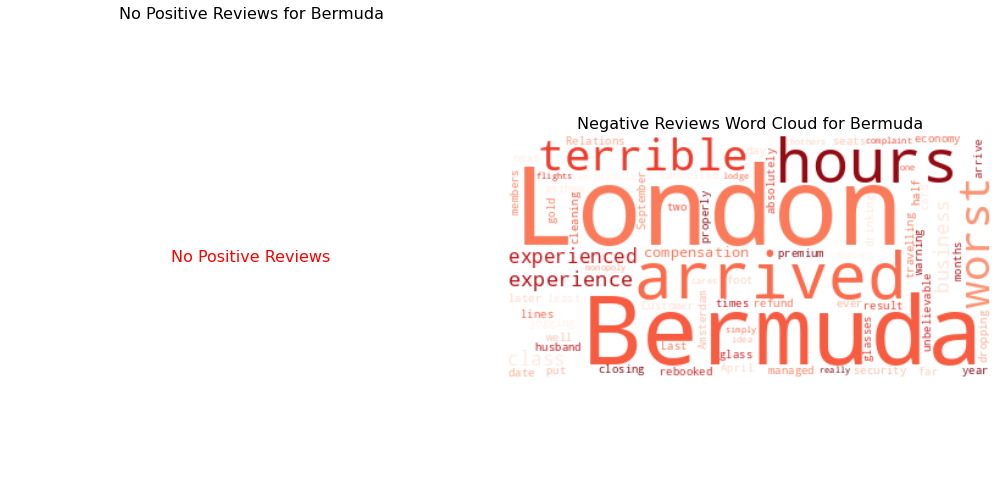

Analyzing Reviews for Botswana


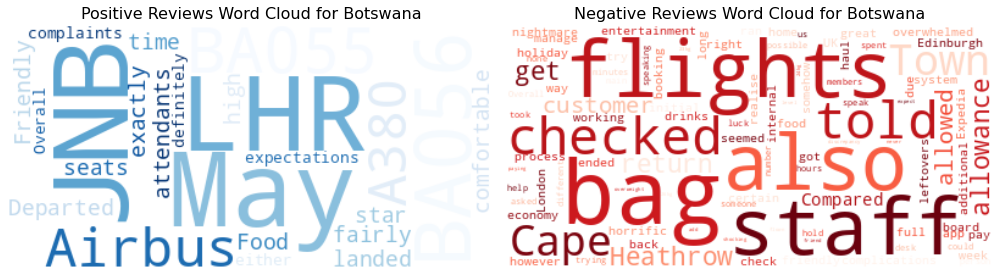

Analyzing Reviews for Brazil


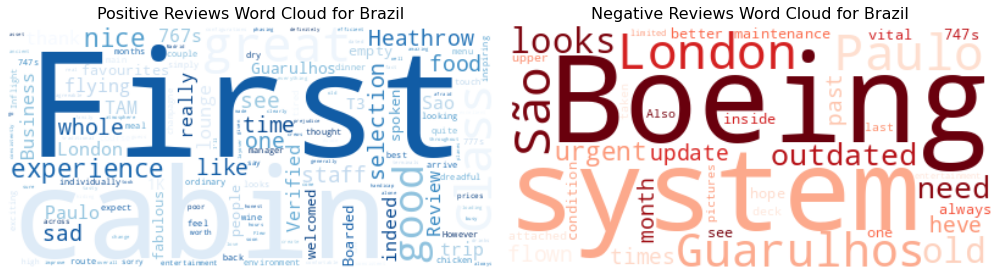

Analyzing Reviews for Panama


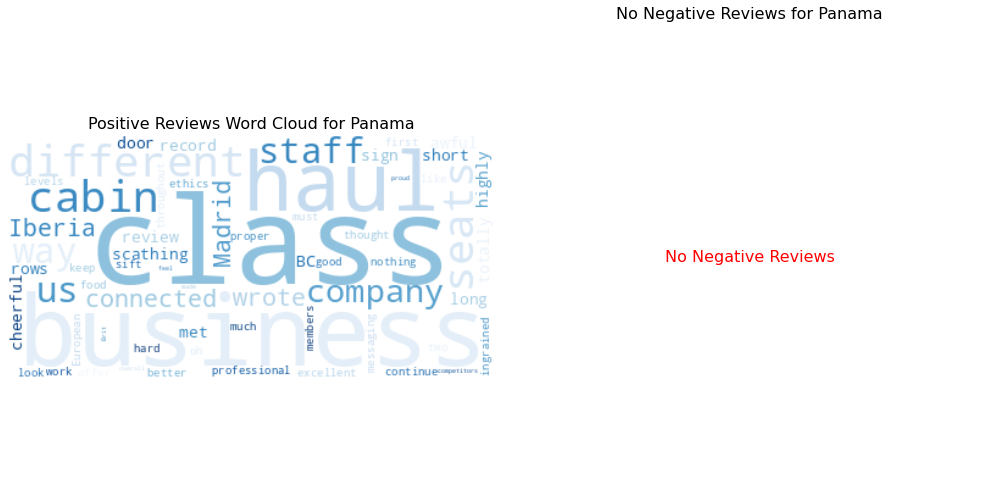

Analyzing Reviews for Russian Federation


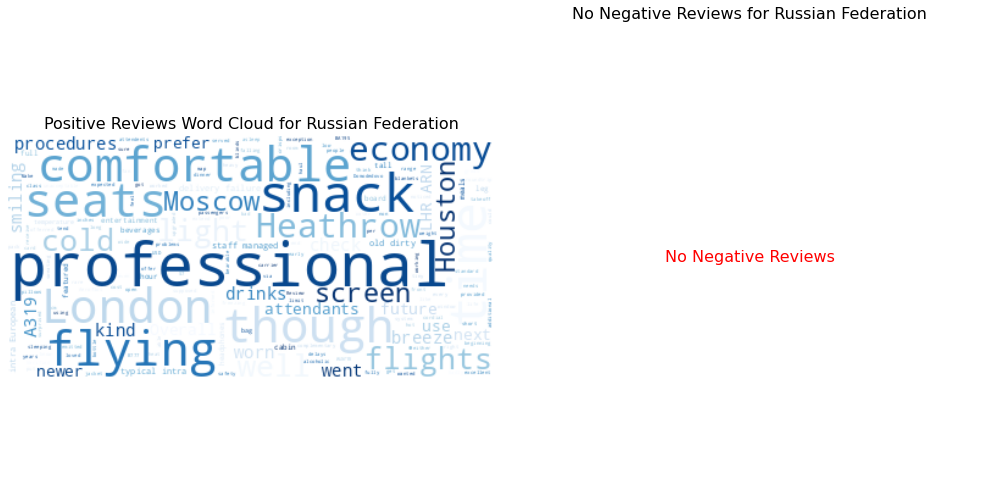

Analyzing Reviews for Philippines


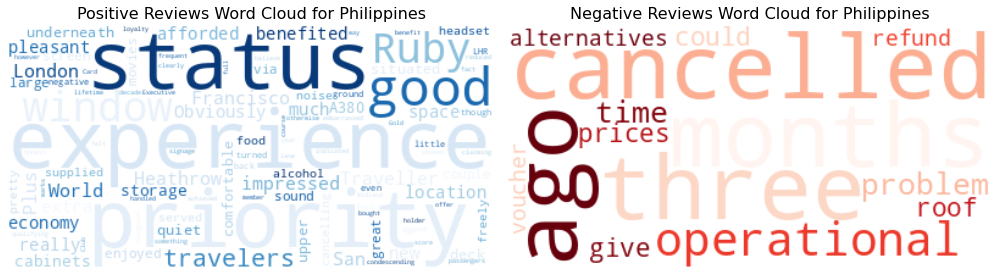

Analyzing Reviews for Bulgaria


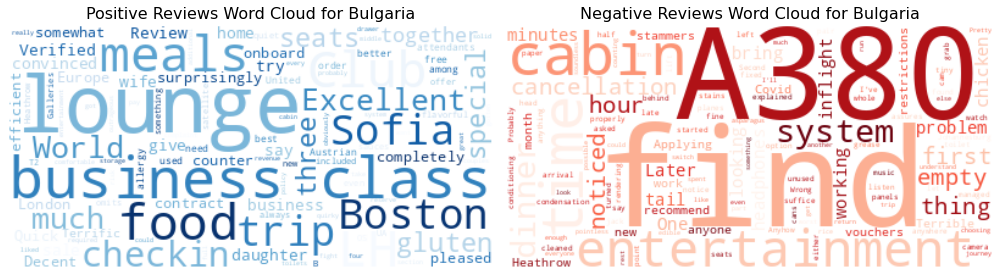

Analyzing Reviews for Thailand


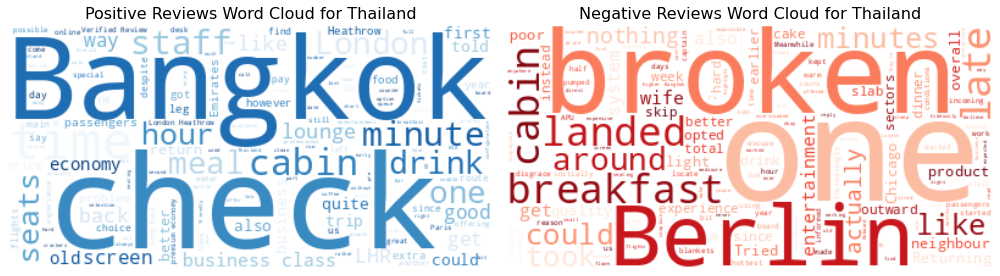

Analyzing Reviews for Argentina


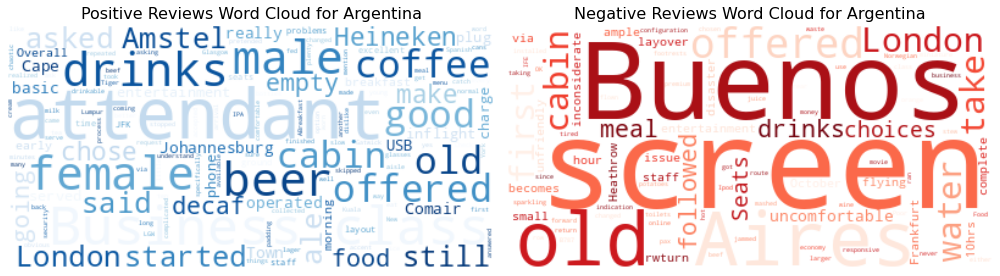

Analyzing Reviews for Mexico


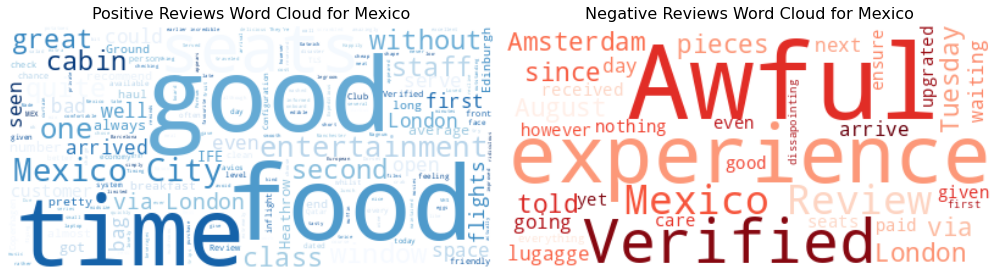

Analyzing Reviews for Saint Kitts and Nevis


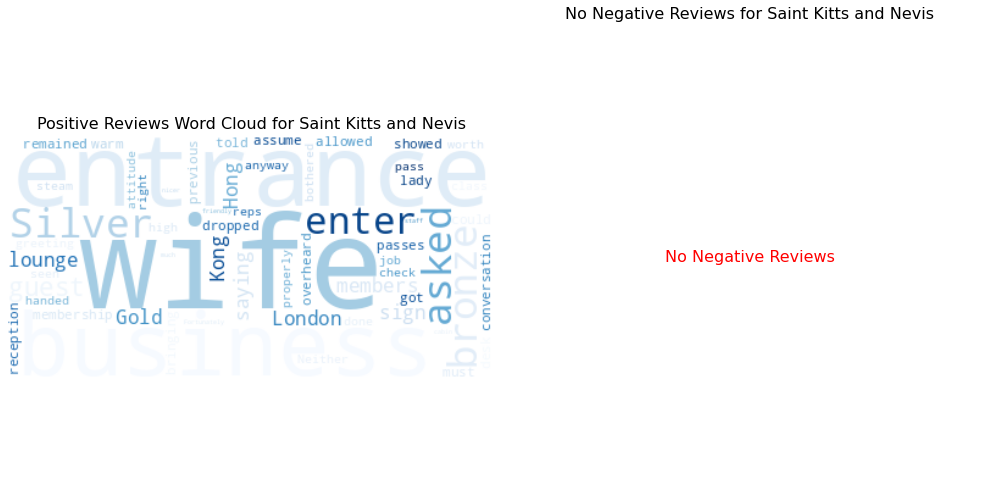

Analyzing Reviews for Vietnam


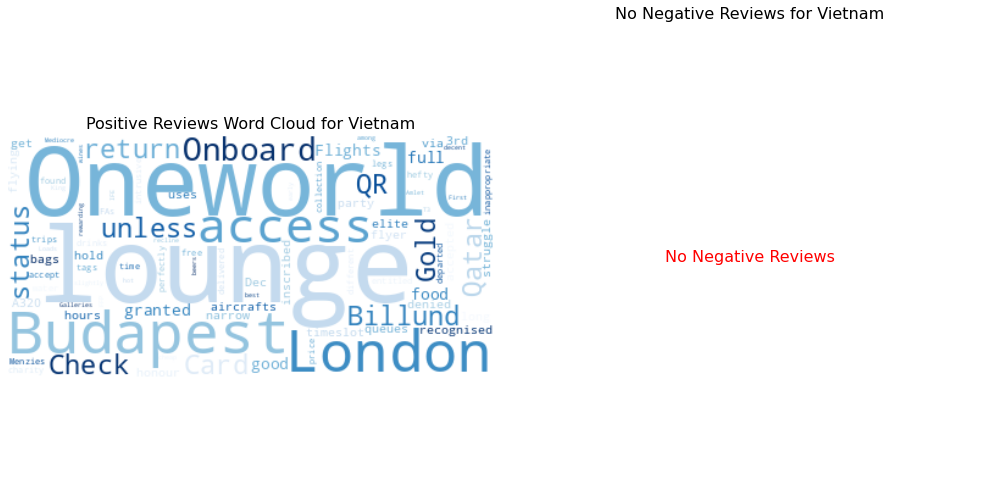

Analyzing Reviews for Norway


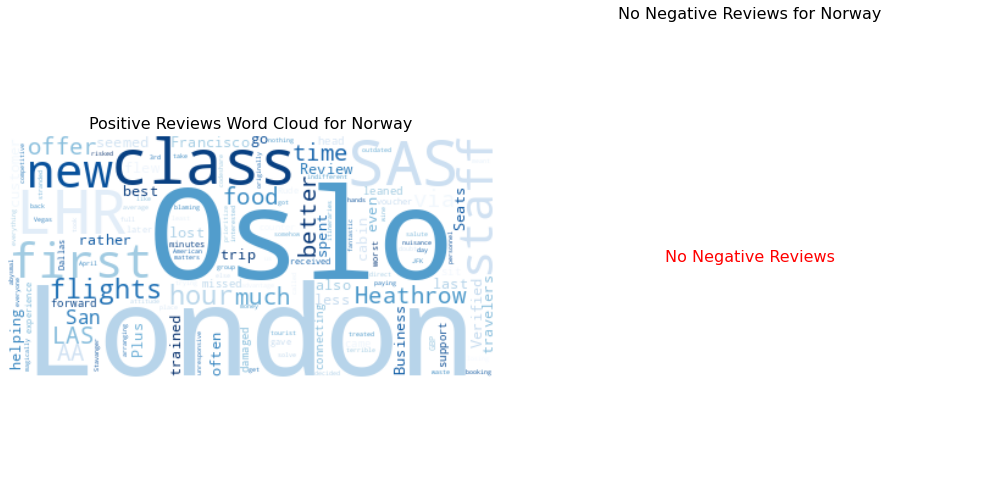

Analyzing Reviews for Jordan


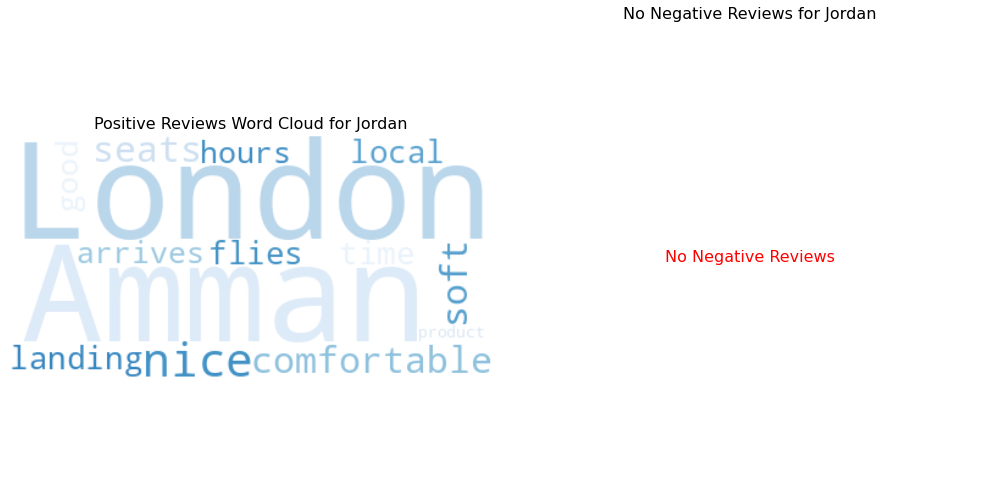

Analyzing Reviews for Taiwan


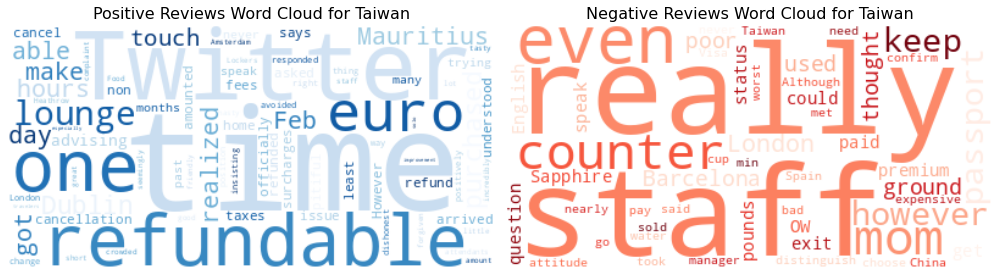

Analyzing Reviews for Slovakia


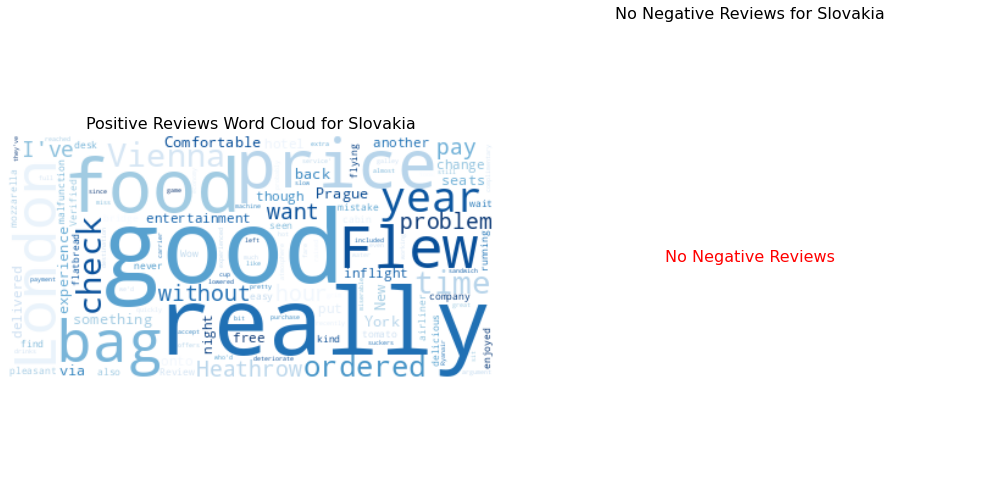

Analyzing Reviews for Israel


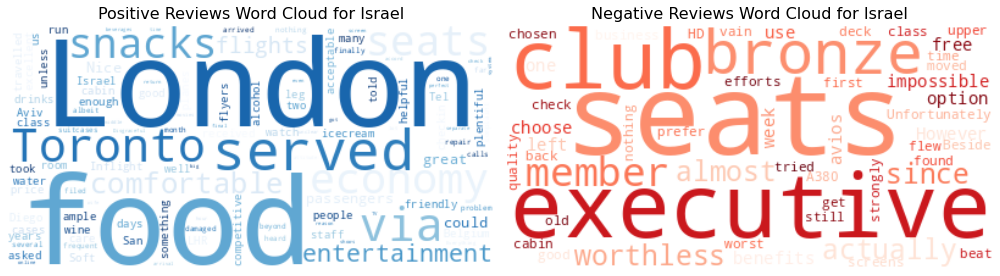

Analyzing Reviews for South Korea


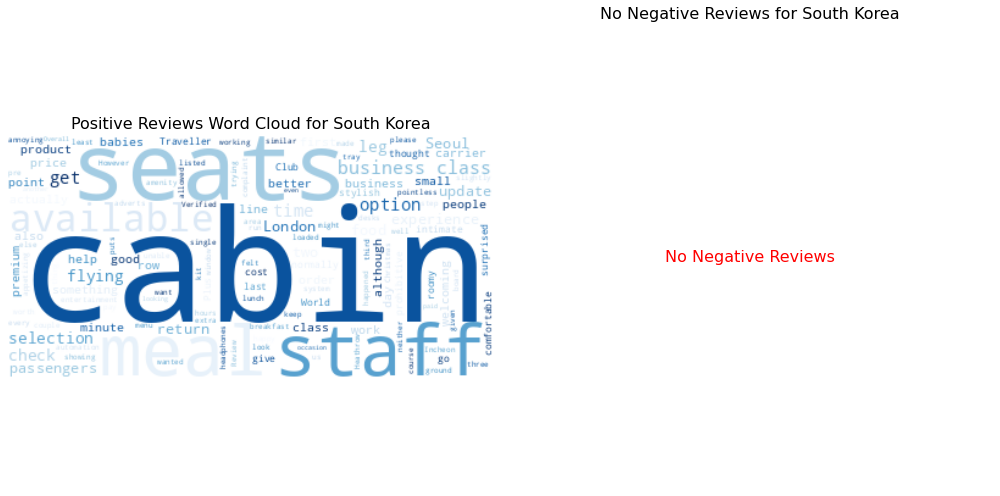

Analyzing Reviews for Saudi Arabia


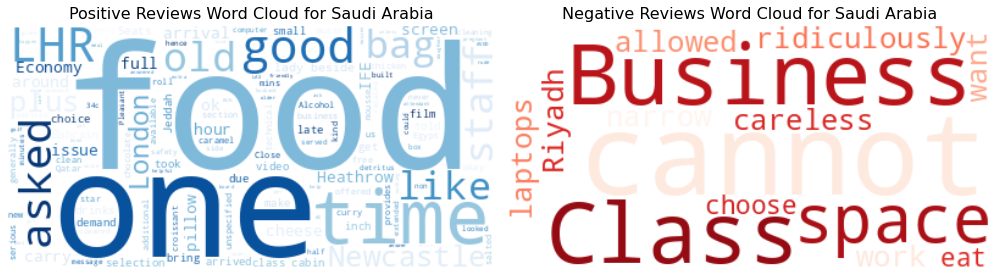

Analyzing Reviews for Hungary


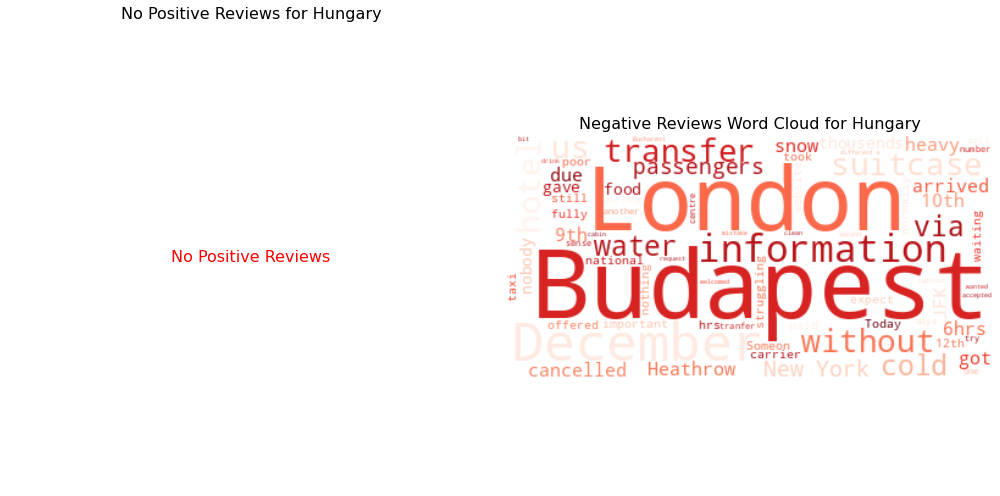

Analyzing Reviews for Portugal


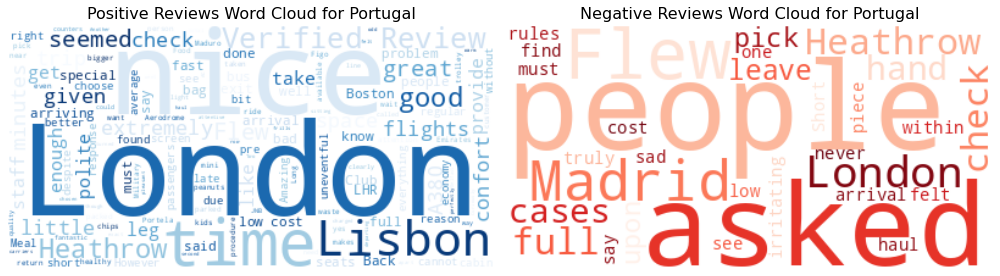

Analyzing Reviews for Cayman Islands


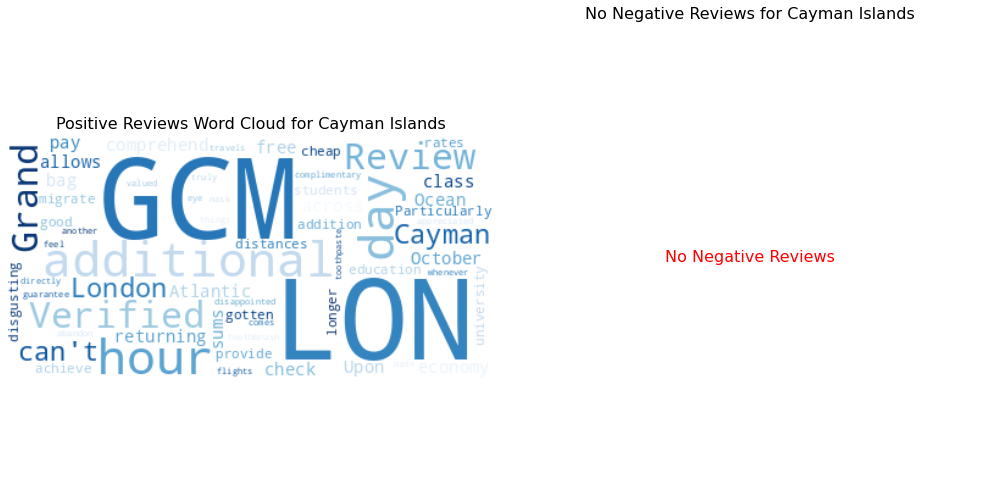

Analyzing Reviews for Costa Rica


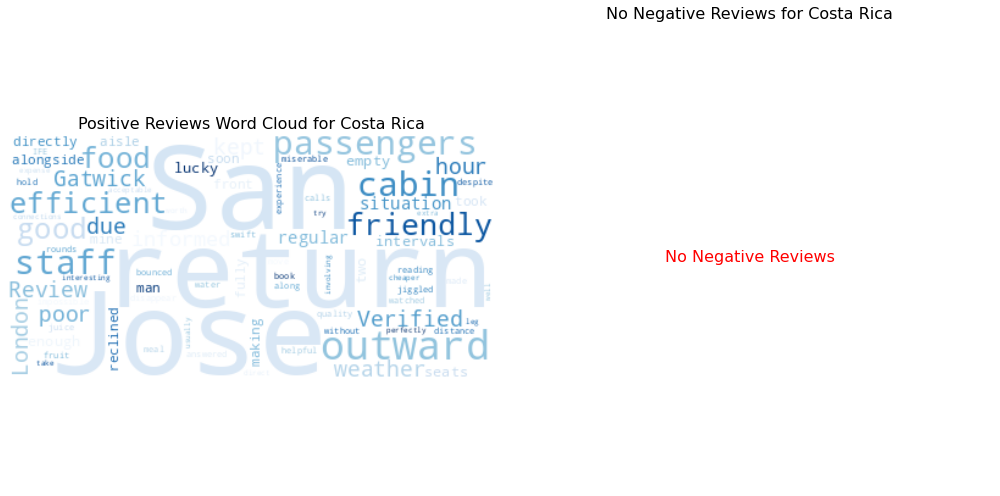

Analyzing Reviews for Egypt


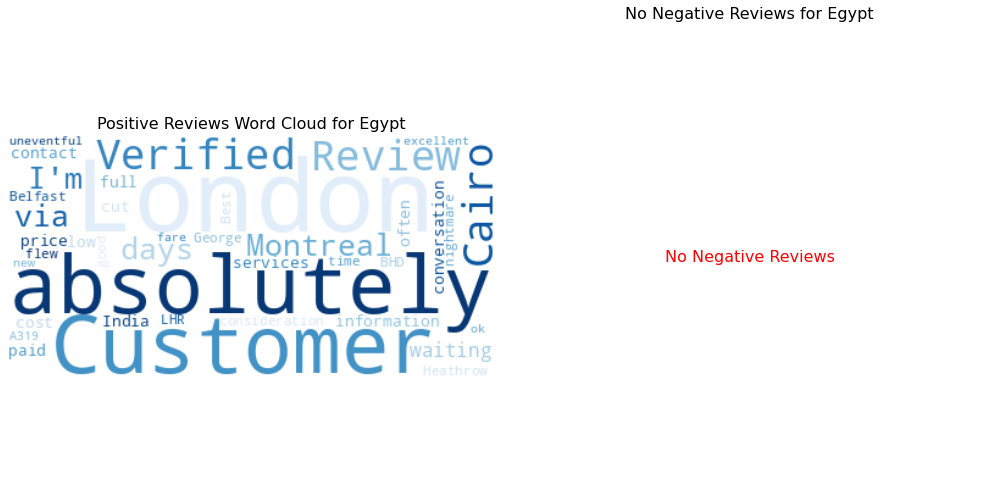

Analyzing Reviews for Laos


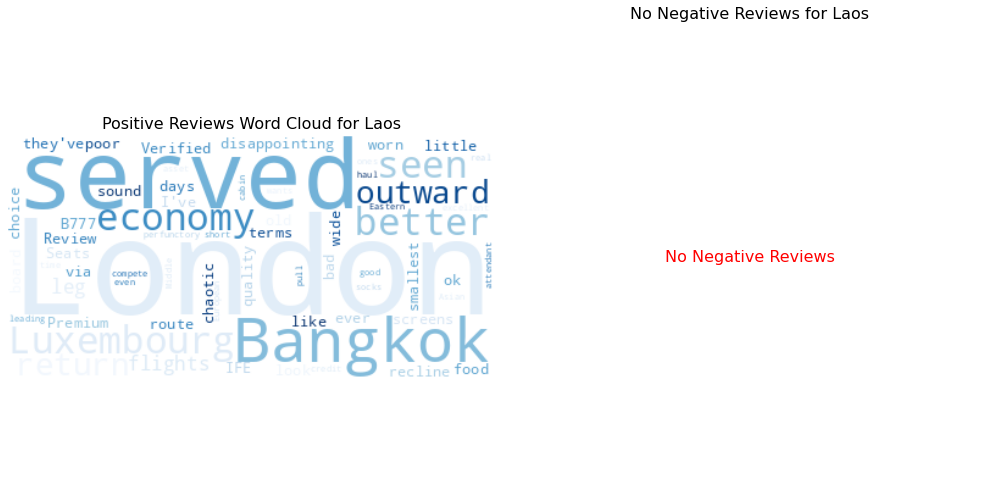

Analyzing Reviews for Indonesia


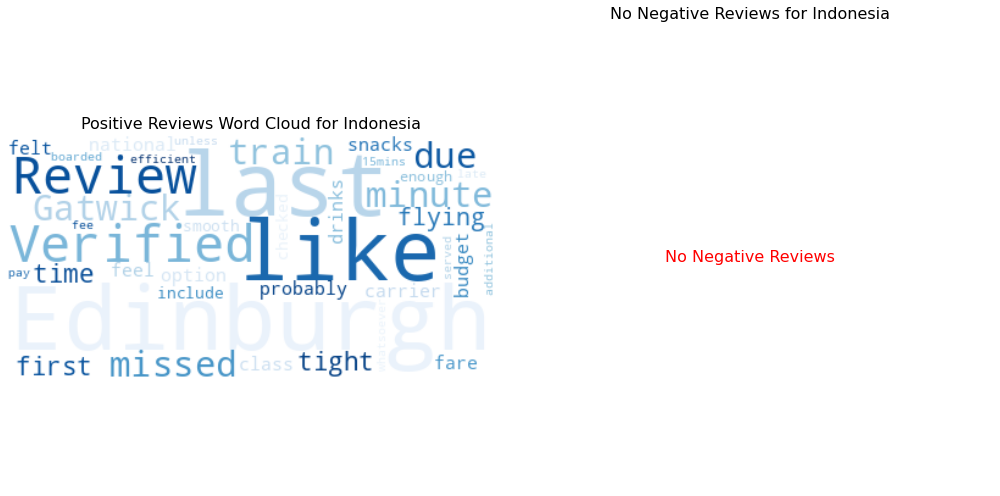

Analyzing Reviews for Bahrain


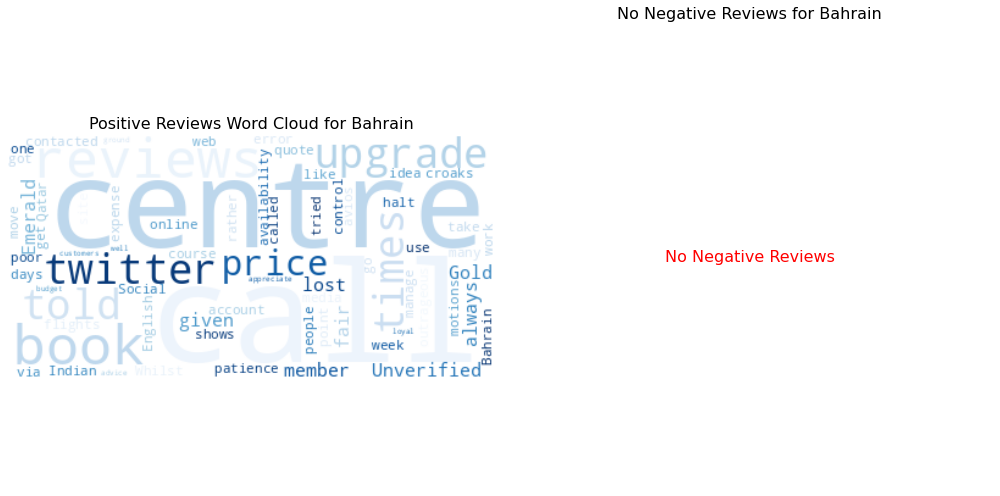

Analyzing Reviews for Dominican Republic


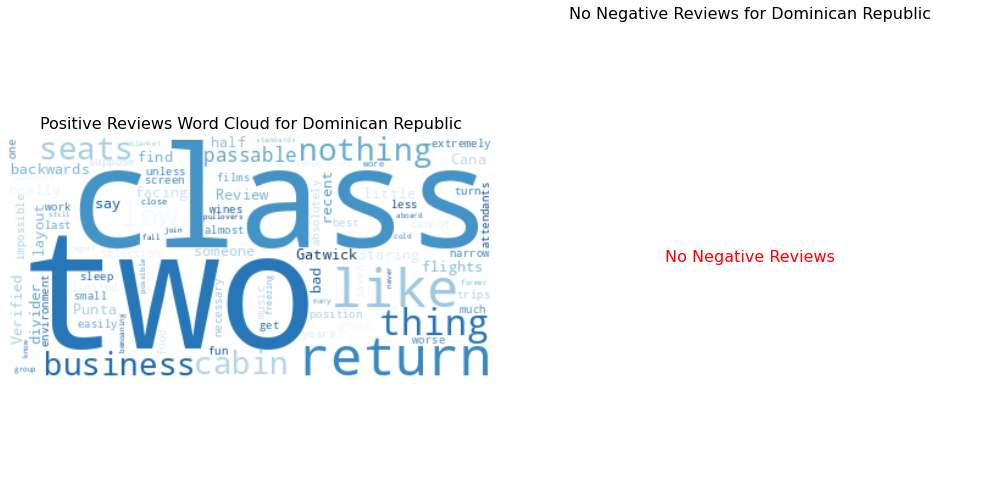

Analyzing Reviews for Luxembourg


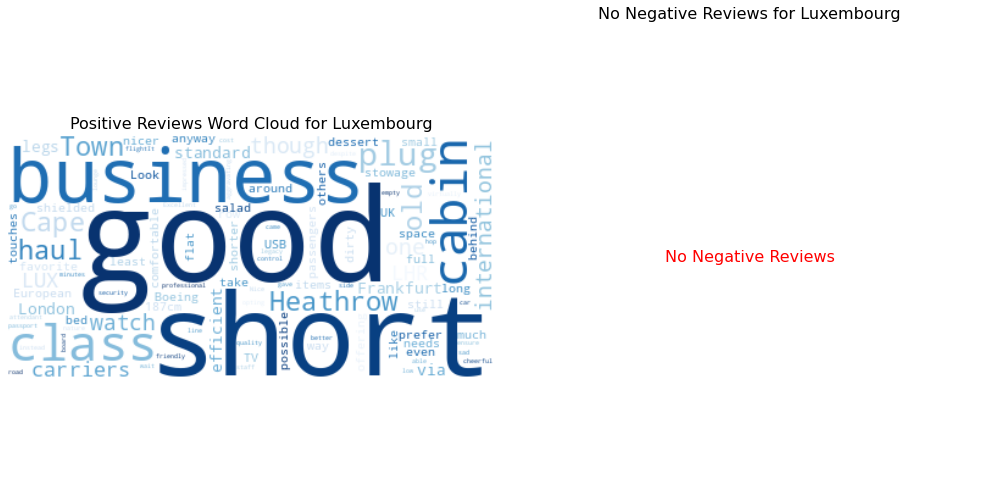

Analyzing Reviews for Finland


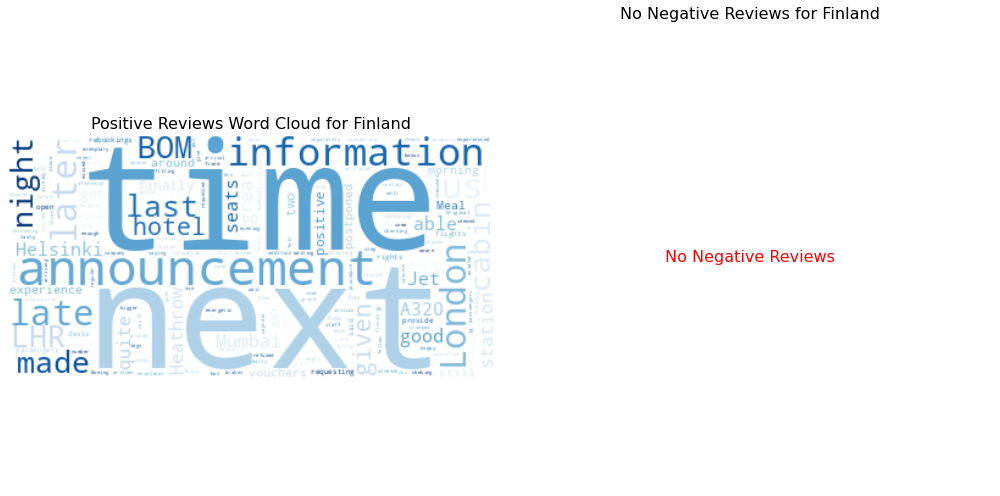

Analyzing Reviews for nan


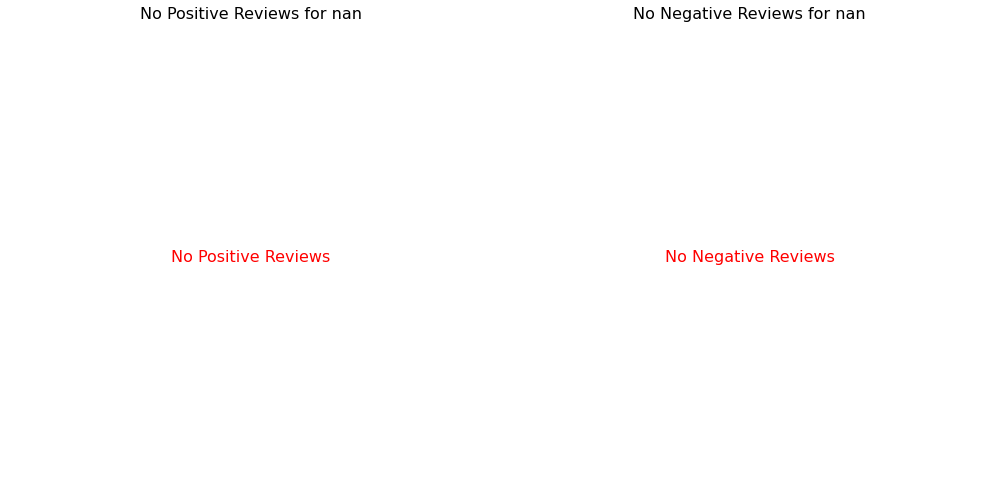

Analyzing Reviews for Trinidad & Tobago


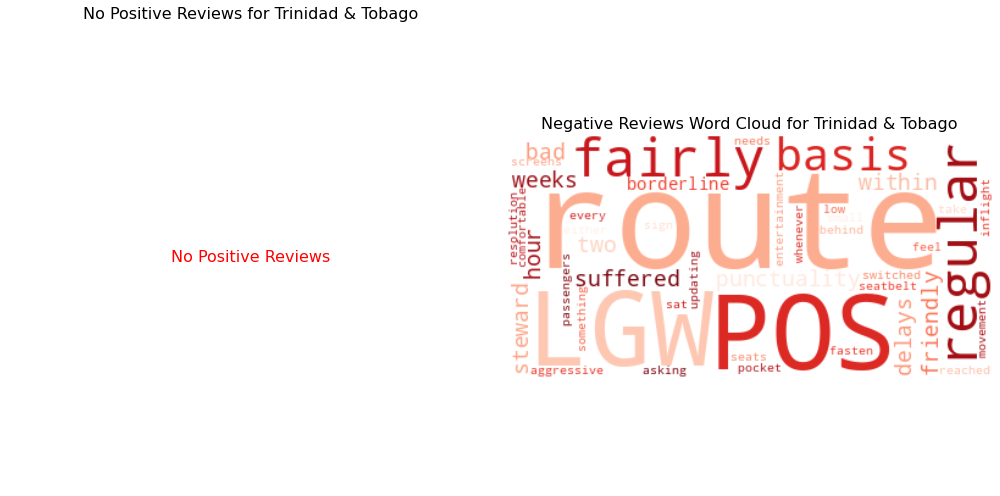

Analyzing Reviews for Barbados


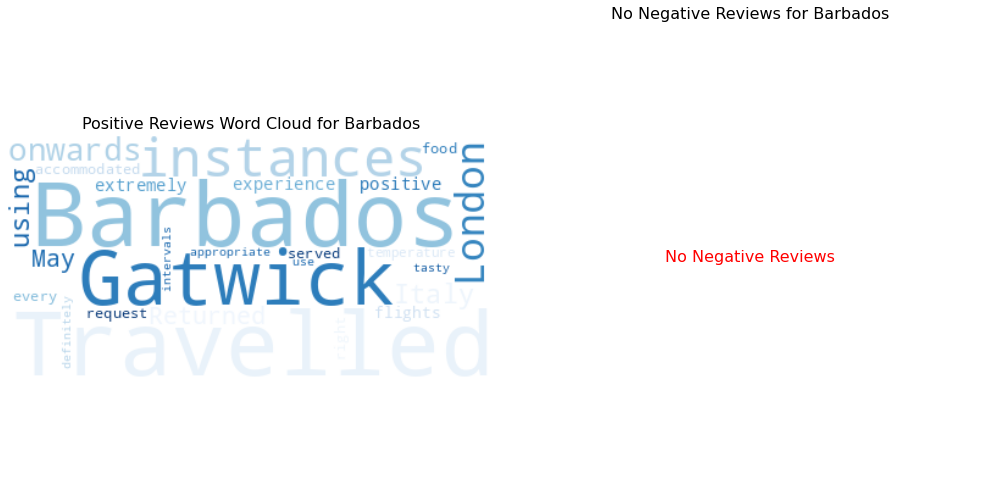

Analyzing Reviews for Oman


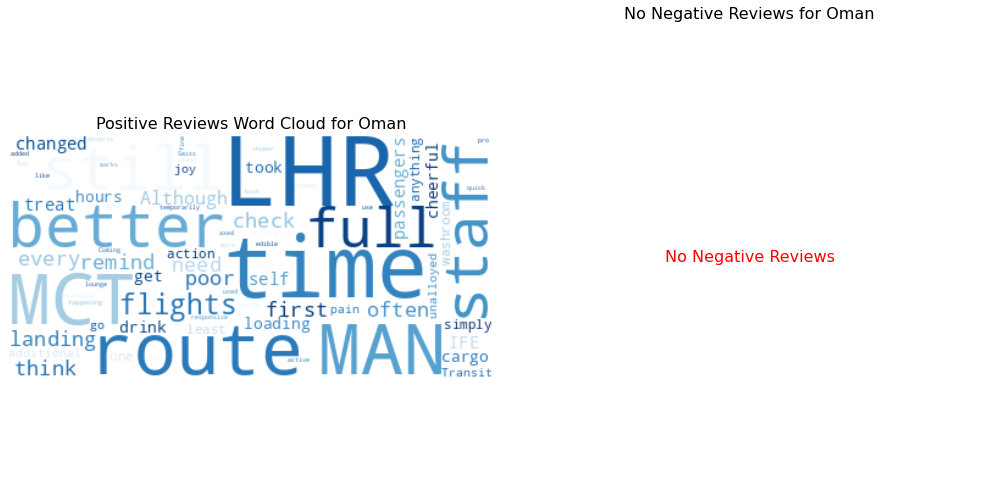

In [5]:
# Domain-specific stopwords related to flight reviews
flight_stopwords = set([
    "british", "airways", "flight", "airline", "plane", "seat", "boarding", "crew", "ticket", "service",
    "ba","-", "delayed", "airport", "luggage", "baggage", "check-in", "boarding", "travel", "class"
    "arrival", "departure", "gate", "delay", "pilot", "flight attendants", "aircraft", "would", "one"
    "journey", "schedule", "terminal", "passenger", "air", "booked", "connection", "boarding pass",
    "plane", "plane's", "flight's", "airlines", "baggage claim", "check in", "traveling", "fly"
])

# Combine standard stopwords with domain-specific stopwords
combined_stopwords = stop_words.union(flight_stopwords)

# List of unique countries in the dataset
unique_countries = data['Country'].unique()

# Lists to collect countries with no positive or negative reviews
countries_no_positive_reviews = []
countries_no_negative_reviews = []

# Iterate over each country
for country_name in unique_countries:
    print(f"Analyzing Reviews for {country_name}")

    # Filter reviews by the specific country and sentiment (Positive or Negative)
    positive_reviews = data[(data['Country'] == country_name) & (data['Sentiment_TextBlob'] == 'Positive')]['Review']
    negative_reviews = data[(data['Country'] == country_name) & (data['Sentiment_TextBlob'] == 'Negative')]['Review']

    # Preprocess the reviews for the selected country
    positive_reviews_text = " ".join(review for review in positive_reviews)
    negative_reviews_text = " ".join(review for review in negative_reviews)

    # Check if there are positive reviews available
    if not positive_reviews_text:
        countries_no_positive_reviews.append(country_name)

    # Check if there are negative reviews available
    if not negative_reviews_text:
        countries_no_negative_reviews.append(country_name)

    # Check if there are reviews for the current sentiment before generating the word clouds
    if positive_reviews_text:
        # Generate word cloud for positive reviews
        positive_wordcloud = WordCloud(stopwords=combined_stopwords, background_color="white", colormap="Blues").generate(positive_reviews_text)
    else:
        positive_wordcloud = None

    if negative_reviews_text:
        # Generate word cloud for negative reviews
        negative_wordcloud = WordCloud(stopwords=combined_stopwords, background_color="white", colormap="Reds").generate(negative_reviews_text)
    else:
        negative_wordcloud = None

    # Plot the word clouds side by side only if available
    plt.figure(figsize=(14, 7))

    # Positive Word Cloud
    if positive_wordcloud:
        plt.subplot(1, 2, 1)
        plt.imshow(positive_wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Positive Reviews Word Cloud for {country_name}", fontsize=16)
    else:
        plt.subplot(1, 2, 1)
        plt.text(0.5, 0.5, "No Positive Reviews", ha='center', va='center', fontsize=16, color='red')
        plt.axis("off")
        plt.title(f"No Positive Reviews for {country_name}", fontsize=16)

    # Negative Word Cloud
    if negative_wordcloud:
        plt.subplot(1, 2, 2)
        plt.imshow(negative_wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Negative Reviews Word Cloud for {country_name}", fontsize=16)
    else:
        plt.subplot(1, 2, 2)
        plt.text(0.5, 0.5, "No Negative Reviews", ha='center', va='center', fontsize=16, color='red')
        plt.axis("off")
        plt.title(f"No Negative Reviews for {country_name}", fontsize=16)

    # Display the plot
    plt.tight_layout()
    plt.show()

# After iterating through all countries, print the countries with no positive or no negative reviews

In [6]:
# Print the countries with no positive or no negative reviews
print("\nCountries with No Positive Reviews:")
print(countries_no_positive_reviews)

print("\nCountries with No Negative Reviews:")
print(countries_no_negative_reviews)


Countries with No Positive Reviews:
['Morocco', 'Ecuador', 'Bermuda', 'Hungary', nan, 'Trinidad & Tobago']

Countries with No Negative Reviews:
['Lebanon', 'Nigeria', 'Ukraine', 'Senegal', 'Chile', 'Panama', 'Russian Federation', 'Saint Kitts and Nevis', 'Vietnam', 'Norway', 'Jordan', 'Slovakia', 'South Korea', 'Cayman Islands', 'Costa Rica', 'Egypt', 'Laos', 'Indonesia', 'Bahrain', 'Dominican Republic', 'Luxembourg', 'Finland', nan, 'Barbados', 'Oman']
